# Introduction to Geographic Information Systems (GIS)

![GIS](img/gis.png?raw=true?raw=true)


## What is GIS?

Geographic Information System (GIS) is a technology that allows users to visualize, analyze, and interpret spatial data.


## Main types of GIS data

1. **Vector Data** (like an SVG)
2. **Raster Data** (like a PNG)

![Raster VS Vector data](img/raster-vs-vector.png?raw=true)


# Raster Data

Raster data is made up of a grid of cells, where each cell has a value representing a specific attribute.

For example, a raster dataset could represent elevation, where each cell's value indicates the height above sea level. Heat maps, satellite images, and digital elevation models are common examples of raster data.


![Raster Example](img/raster.png?raw=true)


# Vector Data

Vector data is made up of points, lines, and polygons. Each of these geometric shapes represents a specific geographic feature.


![Vector Example](img/vector.png?raw=true)


# Popular File Formats for vector GIS Data

1. **Shapefile (.shp)**: A popular vector data format used for storing the geometric location and attribute information of geographic features. It consists of multiple files with the same base name but different extensions.
2. **GeoJSON** (.geojson): A format for encoding a variety of geographic data structures using JavaScript Object Notation (JSON). It is widely used for web mapping applications.
3. **GeoDatabase** (.gdb): A proprietary format used by Esri's ArcGIS software to store and manage spatial data.
4. **WKT (Well-Known Text)**: A text markup language for representing vector geometry objects.


# Important GIS Concepts

1. **Coordinate Reference System (CRS)**: A CRS defines where the two dimensional coordinates, relate to a real place on earth. It is essential for accurately mapping and analyzing spatial data.
2. **Geocoding**: The process of converting addresses or place names into geographic coordinates (latitude and longitude).
3. **Spatial Analysis**: The process of examining the locations, attributes, and relationships of features in spatial data to derive insights and make decisions.


# CRS and Projections

- A Coordinate Reference System (CRS) defines how coordinates are mapped to the surface of the Earth.


# CRS Types

- Geocentric coordinate systems have X,Y, and Z measurements from the Earth's center of mass.

![Geocentric CRS](img/geocentric.png?raw=true)


- Geographic coordinate systems (GCS) use latitude and longitude on a sphere.
- Projected coordinate systems (PCS) represent locations on earth using x,y coordinates on a planar surface.

![GCS and PCS](img/gcs-pcs.png?raw=true)


# EPSG codes

- EPSG codes are unique identifiers for Coordinate Reference Systems (CRS) defined by the European Petroleum Survey Group (EPSG).
- One of the most popular CRS is EPSG: 4326, which is a geographic coordinate system.
- The Web Mercator projection (EPSG:3857) is a 2d PCS used by Google Maps, OpenStreetMap, and other web maps.
- Many NYC datasets use NAD83 / New York Long Island (EPSG: 2263), which is a 2d PCS.


# Applications for GIS

1. **Urban Planning**: GIS is used to analyze land use, zoning, and infrastructure development to make informed decisions about urban growth and development.
2. **Environmental Management**: GIS helps in monitoring natural resources, assessing environmental impacts, and managing conservation efforts.
3. **Transportation**: GIS is used for route optimization, traffic analysis, and transportation planning.
4. **Public Health**: GIS is used to track disease outbreaks, analyze health trends, and plan healthcare services.


# Popular Libraries and Tools for GIS

1. **ArcGIS**: A comprehensive GIS software suite developed by Esri, offering tools for mapping, spatial analysis, and data management.
2. **QGIS**: An open-source GIS software that provides a wide range of features for mapping and spatial analysis.
3. **PostGIS**: An extension of the PostgreSQL database that adds support for geographic objects, allowing for spatial queries and analysis.
4. **Mapbox/Maplibre**: A Javascript library for creating interactive maps and visualizations on the web.
5. **GeoPandas**: A Python library that extends the Pandas library to enable spatial operations on geometric data.


In [1]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import contextily as ctx

# Demo: Geocoding


In [2]:
pd.set_option("display.max_colwidth", 150)

ccny = gpd.tools.geocode(
    "160 Convent ave New York", provider="nominatim", user_agent="autogis_xx", timeout=4
)
ccny

,geometry,address
0,POINT (-73.95101 40.8182),"The City College of New York, 160, Convent Avenue, Manhattanville, Manhattan Community Board 9, Manhattan, New York County, City of New York, New ..."


In [3]:
ccny.explore()

## GeoSupport

GeoSupport is a geocoding package developed by the New York City Department of City Planning. It provides many functions to process geographic information for New York City.
![GOAT](img/goat.png?raw=true)


# Demo: MTA Bus map with ridership heatmap


In [4]:
# Data from: https://trainstat.us/api/v1/routes?route_type=bus&geojson=true
gdf_routes = gpd.read_file("routes.geojson")

# Data from: https://data.ny.gov/Transportation/MTA-Bus-Hourly-Ridership-2020-2024/kv7t-n8in/about_data
df_ridership = pd.read_csv("Bus_Ridership_2024-Oct31.csv")

In [5]:
gdf_routes[["id", "long_name", "geometry"]]

,id,long_name,geometry
0,B1,Bay Ridge - Manhattan Beach,"MULTILINESTRING ((-73.93977 40.57819, -73.9398 40.57825), (-73.9398 40.57825, -73.93982 40.57835), (-73.93982 40.57835, -73.94003 40.57832), (-73...."
1,B100,Mill Basin - Midwood,"MULTILINESTRING ((-73.95726 40.60845, -73.95724 40.60839), (-73.95724 40.60839, -73.9563 40.60849), (-73.9563 40.60849, -73.95534 40.6086), (-73.9..."
2,B101,Franklin Ave Shuttle Bus - Franklin Av - Park Place,"MULTILINESTRING ((-73.95552 40.68046, -73.95547 40.68019), (-73.95547 40.68019, -73.95543 40.67994), (-73.95543 40.67994, -73.9553 40.67926), (-73..."
3,B103,Canarsie - Downtown Brooklyn Ltd,"MULTILINESTRING ((-73.94735 40.63257, -73.94686 40.63208), (-73.94686 40.63208, -73.9466 40.63183), (-73.9466 40.63183, -73.94649 40.63174), (-73...."
4,B11,Sunset Park - Midwood,"MULTILINESTRING ((-73.98157 40.63481, -73.98201 40.63439), (-73.98201 40.63439, -73.98259 40.63383), (-73.98259 40.63383, -73.98317 40.63326), (-7..."
...,...,...,...
352,X37,Bay Ridge - Midtown Manhattan Express,"MULTILINESTRING ((-74.03529 40.61178, -74.03567 40.61214), (-74.03567 40.61214, -74.03589 40.61235), (-74.03589 40.61235, -74.03609 40.61254), (-7..."
353,X38,Sea Gate / Bensonhurst - Midtown Manhattan Express,"MULTILINESTRING ((-74.00267 40.57376, -74.00281 40.57461), (-74.00281 40.57461, -74.00315 40.57643), (-74.00315 40.57643, -74.00324 40.57688), (-7..."
354,X63,Rosedale - Midtown Manhattan Express,"MULTILINESTRING ((-73.97939 40.73726, -73.97952 40.73732), (-73.97952 40.73732, -73.98087 40.73788), (-73.98087 40.73788, -73.98107 40.73796), (-7..."
355,X64,Cambria Heights - Midtown Manhattan Express,"MULTILINESTRING ((-73.97939 40.73726, -73.97952 40.73732), (-73.97952 40.73732, -73.98087 40.73788), (-73.98087 40.73788, -73.98107 40.73796), (-7..."


In [6]:
gdf_routes.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [7]:
df_ridership

,transit_timestamp,bus_route,payment_method,fare_class_category,ridership,transfers
0,01/01/2024 01:00:00 PM,BX18B,metrocard,Metrocard - Other,0.001,0.000
1,01/01/2024 01:00:00 PM,M14A+,metrocard,Metrocard - Seniors & Disability,37.284,6.778
2,01/01/2024 01:00:00 PM,Q18,metrocard,Metrocard - Unlimited 7-Day,16.001,0.000
3,01/01/2024 01:00:00 PM,Q42,metrocard,Metrocard - Unlimited 30-Day,0.000,0.000
4,01/01/2024 01:00:00 PM,B35,metrocard,Metrocard - Students,10.998,2.000
...,...,...,...,...,...,...
15478491,09/30/2024 11:00:00 PM,S44,metrocard,Metrocard - Unlimited 30-Day,1.999,0.000
15478492,09/30/2024 11:00:00 PM,S52,metrocard,Metrocard - Unlimited 30-Day,0.993,0.000
15478493,09/30/2024 11:00:00 PM,Q66,metrocard,Metrocard - Full Fare,7.991,3.997
15478494,09/30/2024 11:00:00 PM,S51,metrocard,Metrocard - Other,1.994,0.000


In [8]:
df_ridership["transit_timestamp"] = pd.to_datetime(df_ridership["transit_timestamp"])

/tmp/ipykernel_217498/1665855873.py:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_ridership["transit_timestamp"] = pd.to_datetime(df_ridership["transit_timestamp"])


In [9]:
df_ridership = df_ridership[df_ridership["transit_timestamp"].dt.year == 2024]

In [10]:
df_ridership_by_route = (
    df_ridership.groupby(["bus_route"])
    .agg({"ridership": "sum"})
    .reset_index()
    .sort_values(by="ridership", ascending=False)
)

In [11]:
gdf_routes = gdf_routes.merge(
    df_ridership_by_route, left_on="id", right_on="bus_route", how="left"
)

In [12]:
%%capture
# Plot the routes with a heatmap based on ridership
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 10))

# Hide lat/lon axes
ax.set_axis_off()

# Plot the routes with matplotlib using the yellow-orange-red colormap
gdf_routes.plot(column="ridership", cmap="YlOrRd", linewidth=2, ax=ax, legend=False)

# Set plot title and labels
# ax.set_title("NYC Bus Routes Heatmap by Ridership", fontsize=15)

# Show plot
plt.show()

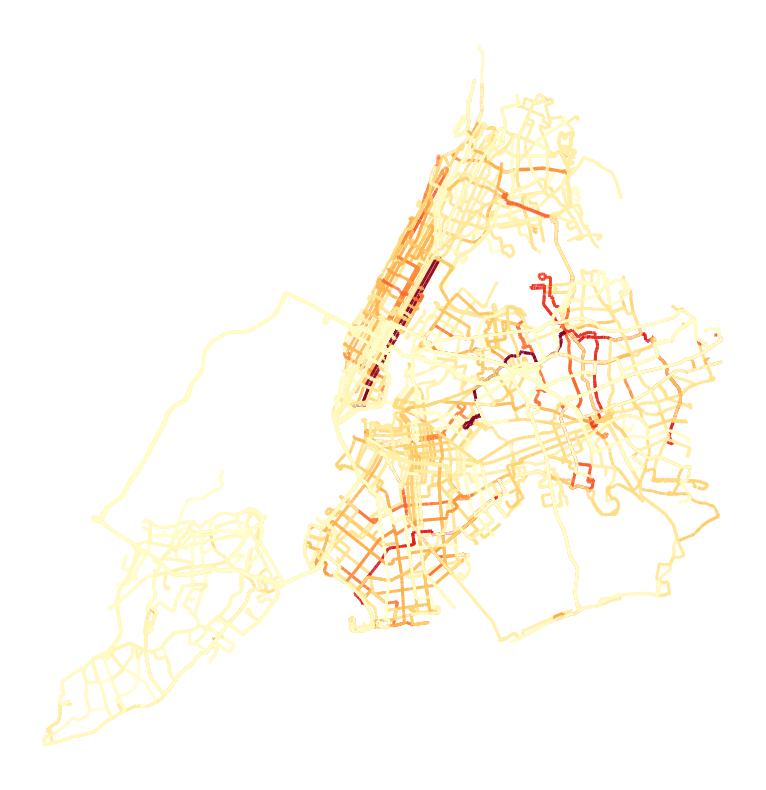

In [13]:
display(fig)

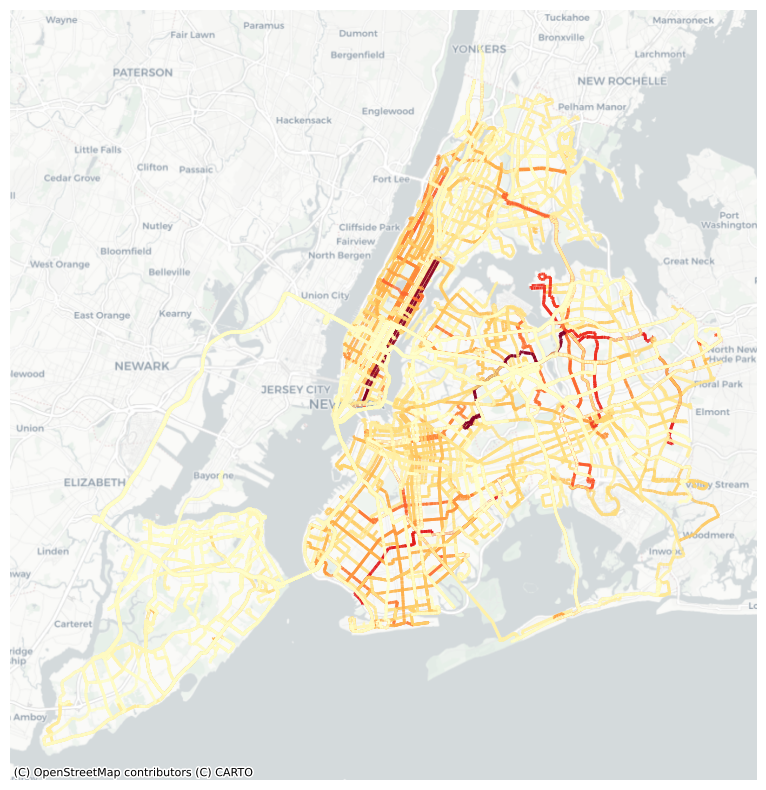

<Figure size 640x480 with 0 Axes>

In [15]:
# Add basemap
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs="EPSG:4326")
display(fig)

In [72]:
gdf_routes.explore(
    column="ridership",
    cmap="YlOrRd",
    tooltip=["id", "ridership"],
    tiles="CartoDB dark_matter",  # Basemap
    location=(40.7128, -74.0060),
    popup=True,
    style_kwds={"weight": 4},  # Make lines thicker
    height="55%",  # Set height to fit in slides
)

# Useful websites for GIS

- [NYC Tile Map Service](https://maps.nyc.gov/tiles/)
- [LION](https://www.arcgis.com/apps/mapviewer/index.html?url=https://services5.arcgis.com/GfwWNkhOj9bNBqoJ/ArcGIS/rest/services/LION/FeatureServer/0&source=sd)
- [NYC GeoSearch](https://geosearch.planninglabs.nyc/)
- [CartoDB Basemap Styles](https://github.com/CartoDB/basemap-styles)
- [Realtime Bus Map](https://github.com/jonerrr/bus-map)
